In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import datetime as dt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis,QuadraticDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn import preprocessing
from sklearn import model_selection
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import roc_auc_score,r2_score,mean_absolute_error,mean_squared_error,accuracy_score,classification_report,confusion_matrix
from sklearn.model_selection import train_test_split,cross_val_score, cross_val_predict
from sklearn import svm,metrics,tree,preprocessing,linear_model
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier, GradientBoostingRegressor
from sklearn.metrics import accuracy_score,mean_squared_error,recall_score,confusion_matrix,f1_score,roc_curve, auc
from plotly.offline import iplot, init_notebook_mode
import pickle
import warnings
warnings.filterwarnings("ignore") 
import datetime as dt
from datetime import datetime
import plotly.express as px
import ortools.constraint_solver
from ortools.constraint_solver import routing_enums_pb2
from ortools.constraint_solver import pywrapcp
from scipy.optimize import linprog
from pylab import rcParams
import scipy
from scipy.stats.stats import pearsonr
import seaborn as sb
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn import utils
from sklearn.metrics import top_k_accuracy_score
from sklearn.metrics import classification_report

C:\Users\balam\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
data = pd.read_csv("USAID_GHSC-PSM_Health_Commodity_Delivery_Dataset_20240315.csv", low_memory=False)

In [3]:
data.shape  #Checking the lengths of the array dimensions

(38505, 104)

In [4]:
data.dtypes  #Checking the number of variables and their type

Task Order                     object
ROPOLine                       object
Condom Adjusted Task Order     object
Country                        object
RO Number                      object
                               ...   
Pick Up                       float64
Deliver                       float64
Quality Assurance             float64
Reason Code                    object
Reason Code Duration          float64
Length: 104, dtype: object

In [5]:
data.head(10)  #Checking the top 10 rows in the dataset

,Task Order,ROPOLine,Condom Adjusted Task Order,Country,RO Number,PO DO IO Number,Order Number,Prime Line Number,Status Name,TLP Indicator,...,RO Validation,Sourcing and Planning,USAID Approval,Process PO/DO,Manufacture,Pick Up,Deliver,Quality Assurance,Reason Code,Reason Code Duration
0,TO1,RO10025160PO100032471,TO1,Mozambique,RO10025160,PO10003247,PO10003247,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,261.0,NaN,NaN,NaN,NaN,NaN,NaN
1,TO1,RO10025160PO100032521,TO1,Mozambique,RO10025160,PO10003252,PO10003252,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,263.0,NaN,NaN,NaN,NaN,NaN,NaN
2,TO1,RO10025160PO100032781,TO1,Mozambique,RO10025160,PO10003278,PO10003278,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,261.0,NaN,NaN,NaN,NaN,NaN,NaN
3,TO1,RO10025160PO100032541,TO1,Mozambique,RO10025160,PO10003254,PO10003254,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,261.0,NaN,NaN,NaN,NaN,NaN,NaN
4,TO1,RO10025160PO100032421,TO1,Mozambique,RO10025160,PO10003242,PO10003242,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,262.0,NaN,NaN,NaN,NaN,NaN,NaN
5,TO1,RO10025160PO100032821,TO1,Mozambique,RO10025160,PO10003282,PO10003282,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,261.0,NaN,NaN,NaN,NaN,NaN,NaN
6,TO1,RO10025160PO100032571,TO1,Mozambique,RO10025160,PO10003257,PO10003257,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,262.0,NaN,NaN,NaN,NaN,NaN,NaN
7,TO1,RO10025160PO100032761,TO1,Mozambique,RO10025160,PO10003276,PO10003276,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,267.0,NaN,NaN,NaN,NaN,NaN,NaN
8,TO1,RO10025160PO100032751,TO1,Mozambique,RO10025160,PO10003275,PO10003275,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,263.0,NaN,NaN,NaN,NaN,NaN,NaN
9,TO1,RO10025160PO100032501,TO1,Mozambique,RO10025160,PO10003250,PO10003250,1,Shipment Delivered,DCP,...,NaN,NaN,0.0,261.0,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
data.info()  #Checking the type of column structure

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38505 entries, 0 to 38504
Columns: 104 entries, Task Order to Reason Code Duration
dtypes: float64(23), int64(10), object(71)
memory usage: 30.6+ MB


In [7]:
# Convert categorical variables to numerical using one-hot encoding
data_encoded = pd.get_dummies(data)

## Clean Data

### Missing Values

In [8]:
data.describe()  # Returning statistical description of the data in the Dataset

,Prime Line Number,Base Unit Multiplier,Estimated Lead Time in Days,Illustrative Price,Ordered Quantity,Shipped Quantity,Average Days Late,Number of Shipments,Delivery Progress,Agreed Delivery Date Year,...,Order Cycle Time,RO Validation,Sourcing and Planning,USAID Approval,Process PO/DO,Manufacture,Pick Up,Deliver,Quality Assurance,Reason Code Duration
count,38505.000000,38505.000000,27255.000000,38380.000000,3.850500e+04,3.850500e+04,38495.000000,38505.000000,38505.0,38429.000000,...,38505.000000,19024.000000,18948.000000,35560.000000,36208.000000,26476.000000,18921.000000,24751.000000,3138.000000,18705.000000
mean,5.004389,236.102431,160.555421,526.030668,3.858856e+04,3.852701e+04,-98.057950,1.092949,2.0,2019.868042,...,237.693364,23.104815,61.171997,4.362964,54.932087,72.152855,40.246393,38.670882,31.327916,-3267.652072
std,8.915879,674.238044,85.413175,4613.893616,2.368195e+05,2.366138e+05,1752.108182,0.644309,0.0,4.007993,...,131.609335,44.654262,61.332731,15.712740,64.850677,81.499240,47.719748,43.895107,794.082432,11203.708145
min,1.000000,0.500000,0.000000,0.010000,0.000000e+00,0.000000e+00,-56943.000000,1.000000,2.0,2015.000000,...,-335.000000,-401.000000,-190.000000,-146.000000,-9.000000,-458.000000,-388.000000,-404.000000,-44341.000000,-365242.000000
25%,1.000000,1.000000,98.000000,6.540000,2.700000e+01,2.700000e+01,-1.000000,1.000000,2.0,2018.000000,...,146.000000,2.000000,20.000000,0.000000,16.000000,12.000000,15.000000,10.000000,17.000000,-85.000000
50%,2.000000,25.000000,147.000000,30.715000,2.600000e+02,2.600000e+02,0.000000,1.000000,2.0,2020.000000,...,219.000000,8.000000,42.000000,1.000000,34.000000,50.000000,30.000000,20.000000,34.000000,-37.000000
75%,5.000000,100.000000,203.000000,150.000000,6.000000e+03,6.000000e+03,5.000000,1.000000,2.0,2021.000000,...,311.000000,26.000000,82.000000,3.000000,69.000000,107.000000,54.000000,58.000000,58.000000,0.000000
max,124.000000,20000.000000,1260.000000,193455.000000,1.512000e+07,1.512000e+07,765.000000,32.000000,2.0,2108.000000,...,1164.000000,638.000000,530.000000,303.000000,775.000000,753.000000,652.000000,639.000000,581.000000,29262.000000


### Check for Duplicate Values

In [9]:
np.sum(data.isna()) #Checking the number of missing values for each variable

Task Order                        0
ROPOLine                          0
Condom Adjusted Task Order        0
Country                           0
RO Number                         0
                              ...  
Pick Up                       19584
Deliver                       13754
Quality Assurance             35367
Reason Code                   14009
Reason Code Duration          19800
Length: 104, dtype: int64

### Cleaning

In [10]:
data.columns = [col.lower().replace(' ', '_') for col in data.columns]
data.rename(columns=lambda x: x.replace("(", "").replace(")", ""), inplace=True)

In [11]:
data.columns

Index(['task_order', 'ropoline', 'condom_adjusted_task_order', 'country',
       'ro_number', 'po_do_io_number', 'order_number', 'prime_line_number',
       'status_name', 'tlp_indicator',
       ...
       'ro_validation', 'sourcing_and_planning', 'usaid_approval',
       'process_po/do', 'manufacture', 'pick_up', 'deliver',
       'quality_assurance', 'reason_code', 'reason_code_duration'],
      dtype='object', length=104)

## Correlation Matrix

In [12]:
HM = data.copy()

In [13]:
le = preprocessing.LabelEncoder()

HM['task_order'] = le.fit_transform(data['task_order'])
HM['ropoline'] = le.fit_transform(data['ropoline'])
HM['condom_adjusted_task_order'] = le.fit_transform(data['condom_adjusted_task_order'])
HM['country'] = le.fit_transform(data['country'])
HM['ro_number'] = le.fit_transform(data['ro_number'])
HM['po_do_io_number'] = le.fit_transform(data['po_do_io_number'])
HM['order_number'] = le.fit_transform(data['order_number'])
HM['prime_line_number'] = le.fit_transform(data['prime_line_number'])
HM['status_name'] = le.fit_transform(data['status_name'])
HM['tlp_indicator'] = le.fit_transform(data['tlp_indicator'])
HM['ro_validation'] = le.fit_transform(data['ro_validation'])
HM['sourcing_and_planning'] = le.fit_transform(data['sourcing_and_planning'])
HM['usaid_approval'] = le.fit_transform(data['usaid_approval'])
HM['process_po/do'] = le.fit_transform(data['process_po/do'])
HM['manufacture'] = le.fit_transform(data['manufacture'])
HM['pick_up'] = le.fit_transform(data['pick_up'])
HM['deliver'] = le.fit_transform(data['deliver'])
HM['quality_assurance'] = le.fit_transform(data['quality_assurance'])
HM['reason_code'] = le.fit_transform(data['reason_code'])
HM['reason_code_duration'] = le.fit_transform(data['reason_code_duration'])

<Axes: >

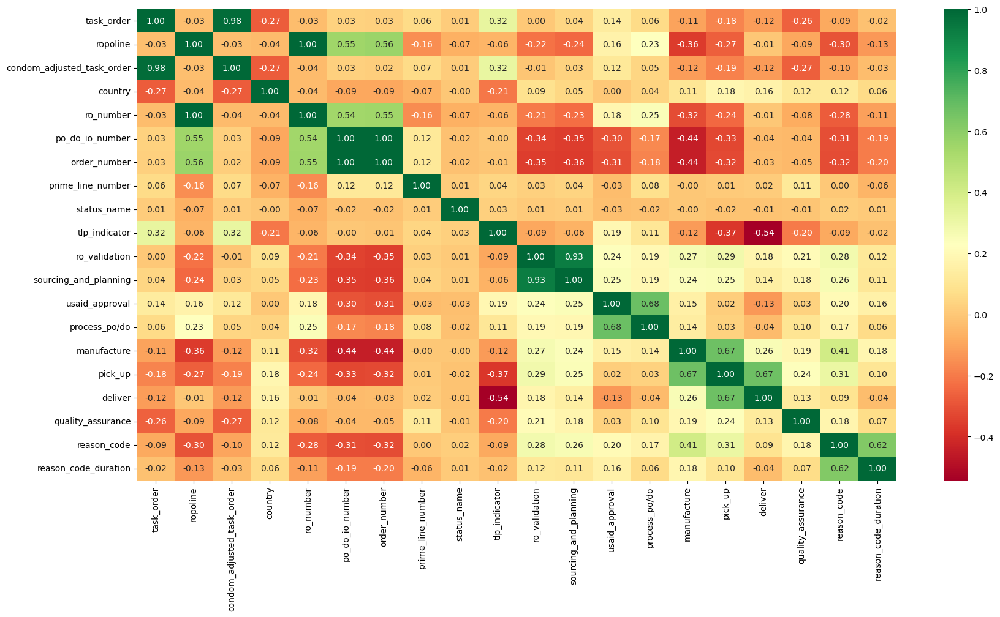

In [14]:
SC_features = HM[['task_order', 'ropoline', 'condom_adjusted_task_order', 'country',
                     'ro_number', 'po_do_io_number', 'order_number', 'prime_line_number',
                     'status_name', 'tlp_indicator',
                     'ro_validation', 'sourcing_and_planning', 'usaid_approval',
                     'process_po/do', 'manufacture', 'pick_up', 'deliver',
                     'quality_assurance', 'reason_code', 'reason_code_duration'
                     ]]

fig = plt.figure(figsize=(20, 10))
sns.heatmap(SC_features.corr(), annot=True, fmt='.2f', cmap="RdYlGn")


## Exploratory Data Analysis (EDA) with Pair Plots

In [15]:
%matplotlib inline
rcParams['figure.figsize']=5,4
sb.set_style('whitegrid')

In [16]:
MP=HM[['task_order', 'ropoline', 'condom_adjusted_task_order', 'country',
                     'ro_number', 'po_do_io_number', 'order_number', 'prime_line_number',
                     'status_name', 'tlp_indicator',
                     'ro_validation', 'sourcing_and_planning', 'usaid_approval',
                     'process_po/do', 'manufacture', 'pick_up', 'deliver',
                     'quality_assurance', 'reason_code', 'reason_code_duration'
                     ]]

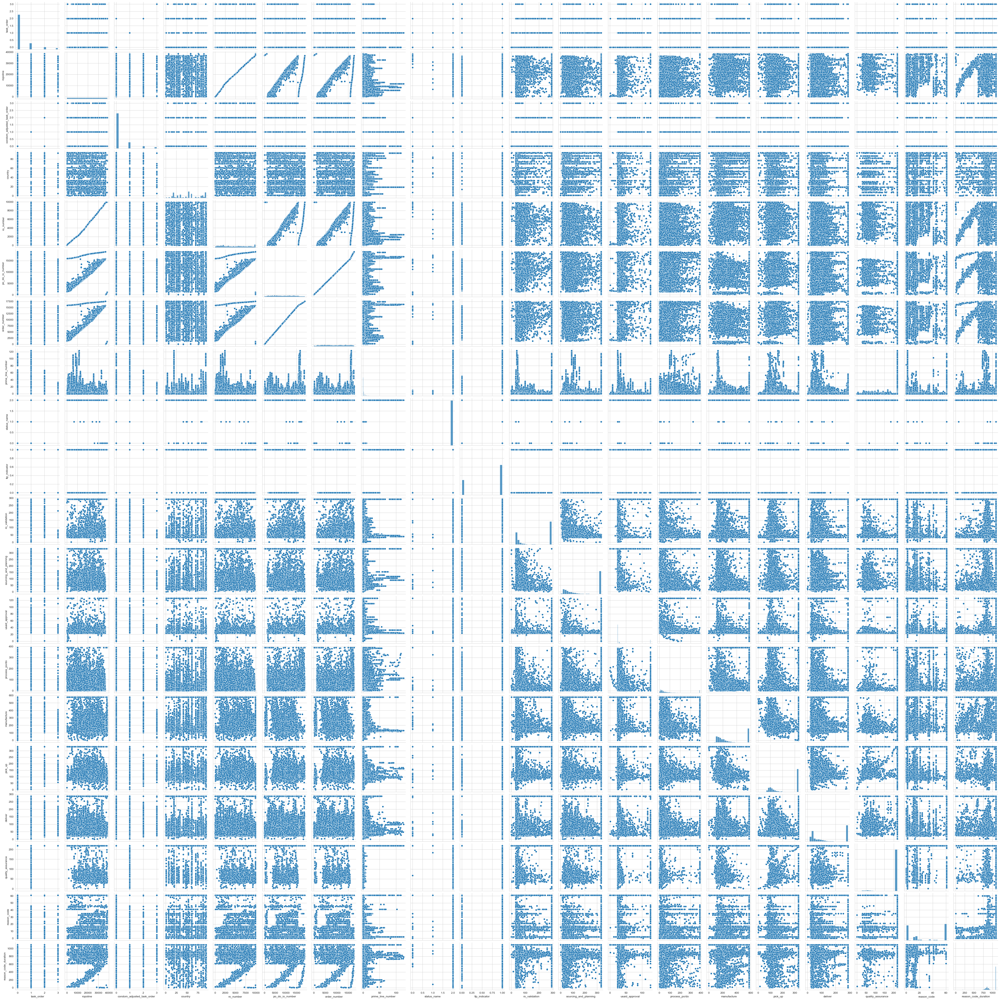

In [17]:
sb.pairplot(MP)

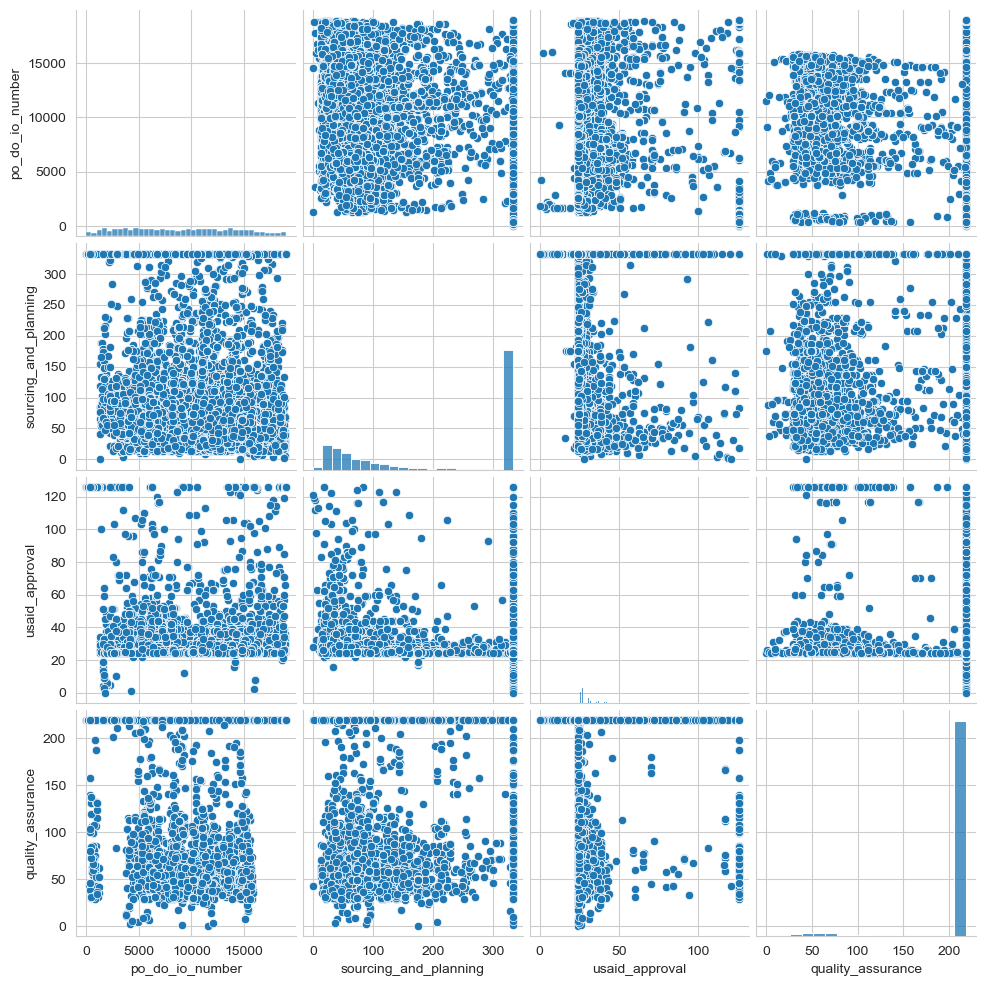

In [18]:
SupplierPerformance = HM[['po_do_io_number', 'sourcing_and_planning', 'usaid_approval', 'quality_assurance' ]]

sb.pairplot(SupplierPerformance)

In [19]:
#Examine the correlation between supplier-related variables 
#(po_do_io_number, sourcing_and_planning, usaid_approval) to assess supplier performance 
#and its relationship with other factors.
SupplierPerformanceCorr=SupplierPerformance.corr()
SupplierPerformanceCorr

,po_do_io_number,sourcing_and_planning,usaid_approval,quality_assurance
po_do_io_number,1.000000,-0.354841,-0.300806,-0.043550
sourcing_and_planning,-0.354841,1.000000,0.249411,0.177832
usaid_approval,-0.300806,0.249411,1.000000,0.030711
quality_assurance,-0.043550,0.177832,0.030711,1.000000


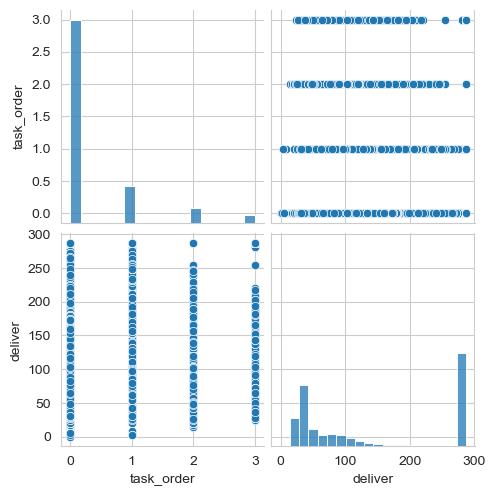

In [20]:
OrderProcessingEfficiency = HM[['task_order','deliver']]

sb.pairplot(OrderProcessingEfficiency)

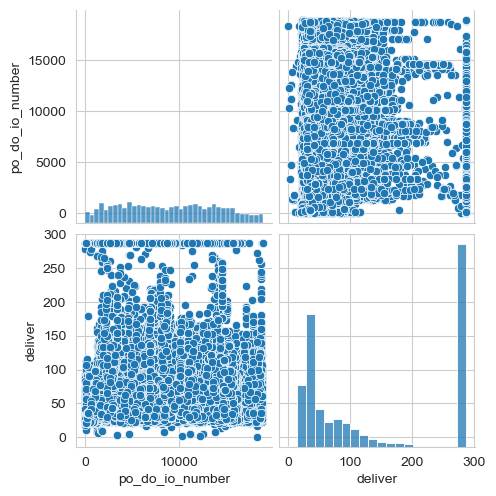

In [21]:
InventoryManagement = HM[['po_do_io_number', 'deliver']]

sb.pairplot(InventoryManagement)

In [22]:
#Analyze the correlation between inventory-related variables (po_do_io_number, deliver) 
#to optimize inventory management processes.
InventoryManagementCorr=InventoryManagement.corr()
InventoryManagementCorr

,po_do_io_number,deliver
po_do_io_number,1.000000,-0.037221
deliver,-0.037221,1.000000


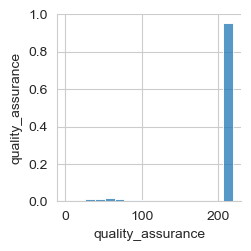

In [23]:
QualityControl = HM[['quality_assurance']]

sb.pairplot(QualityControl)

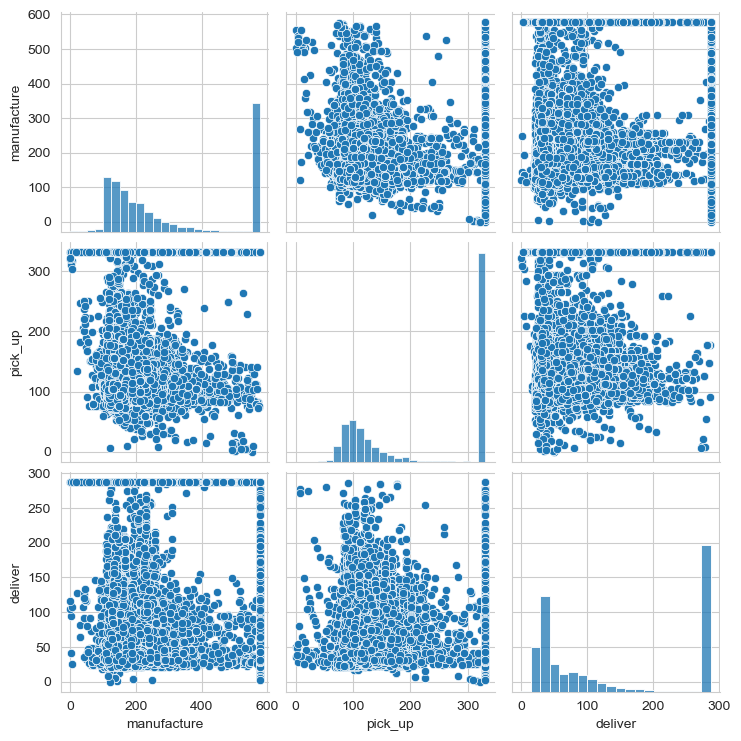

In [24]:
LogisticsOptimization = HM[['manufacture', 'pick_up', 'deliver']]

sb.pairplot(LogisticsOptimization)

In [25]:
#Explore the correlation between logistics-related variables (manufacture, pick_up, deliver) to identify dependencies and optimize supply chain logistics.
LogisticsOptimizationCorr=LogisticsOptimization.corr()
LogisticsOptimizationCorr

,manufacture,pick_up,deliver
manufacture,1.000000,0.674094,0.256142
pick_up,0.674094,1.000000,0.669414
deliver,0.256142,0.669414,1.000000


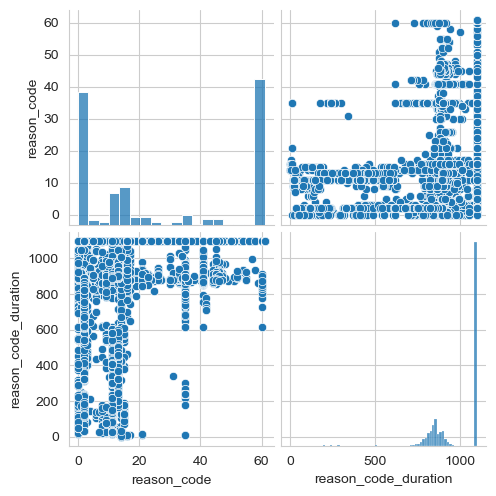

In [26]:
RootCauseAnalysisforDelays = HM[['reason_code', 'reason_code_duration']]

sb.pairplot(RootCauseAnalysisforDelays)

In [27]:
#Investigate the correlation between reason codes (reason_code) and corresponding duration 
#(reason_code_duration) to understand the reasons for delays and their impact on the supply chain.
RootCauseAnalysisforDelaysCorr=RootCauseAnalysisforDelays.corr()
RootCauseAnalysisforDelaysCorr

,reason_code,reason_code_duration
reason_code,1.000000,0.623526
reason_code_duration,0.623526,1.000000


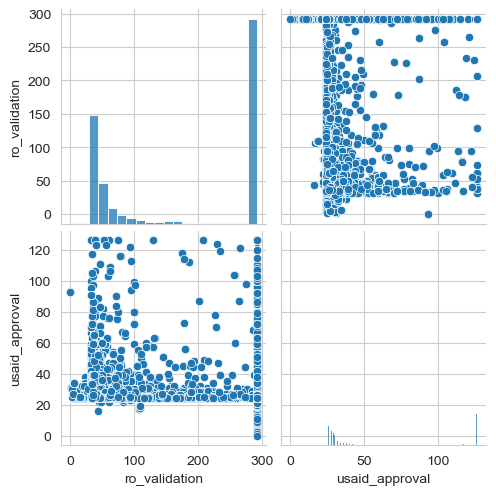

In [28]:
ComplianceMonitoring = HM[['ro_validation', 'usaid_approval']]

sb.pairplot(ComplianceMonitoring)

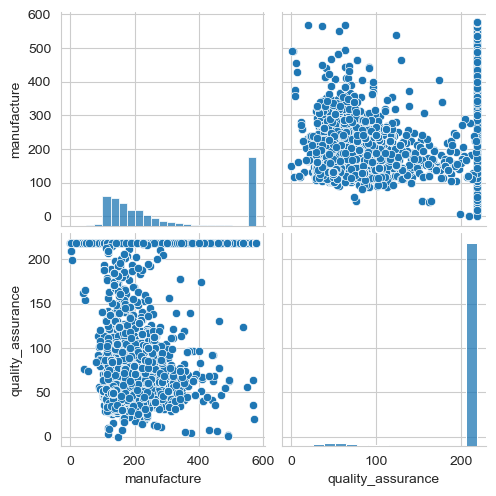

In [29]:
PredictiveMaintenance = HM[['manufacture', 'quality_assurance']]

sb.pairplot(PredictiveMaintenance)

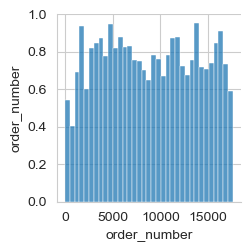

In [30]:
DemandForecasting = HM[['order_number']]

sb.pairplot(DemandForecasting)

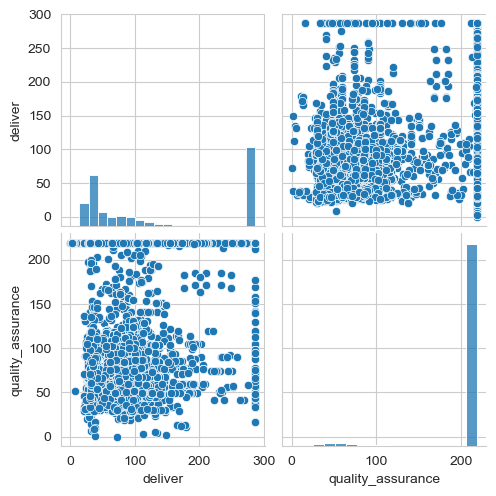

In [31]:
CustomerSatisfaction = HM[['deliver', 'quality_assurance']]

sb.pairplot(CustomerSatisfaction)

## Visual Data

In [32]:
Product = HM.groupby('task_order') 
Route = HM.groupby('ropoline')
Customer = HM.groupby('condom_adjusted_task_order')
Shipping = HM.groupby('country')
Location = HM.groupby('ro_number')
Transportation = HM.groupby('po_do_io_number')
Status = HM.groupby('order_number')
TLP_Indicator = HM.groupby('prime_line_number')
RO_Validation = HM.groupby('status_name')
Sourcing_and_Planning = HM.groupby('tlp_indicator')
USAID_Approval = HM.groupby('ro_validation')
Process_PO_DO = HM.groupby('sourcing_and_planning')
Manufacture = HM.groupby('usaid_approval')
Pick_Up = HM.groupby('process_po/do')
Deliver = HM.groupby('manufacture')
Quality_Assurance = HM.groupby('pick_up')
Reason_Code = HM.groupby('deliver')
Reason_Code_Duration = HM.groupby('quality_assurance')

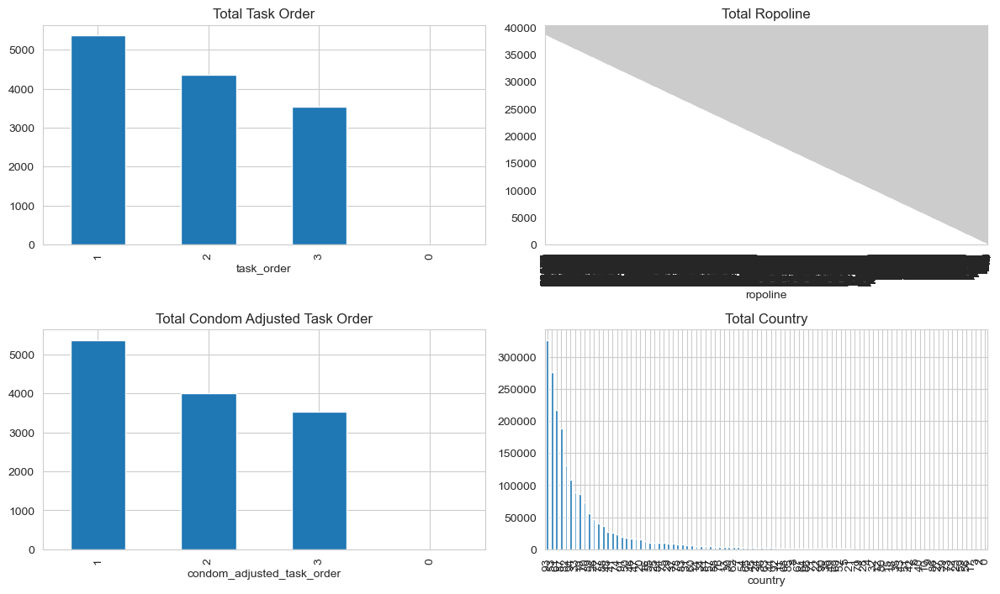

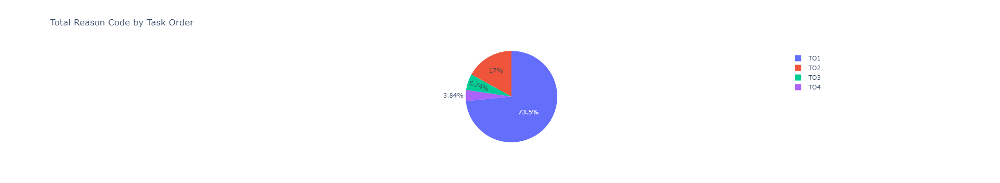

In [33]:
plt.figure(figsize=(16, 16))

plt.subplot(4, 2, 1)
Product['task_order'].sum().sort_values(ascending=False).plot.bar(figsize=(12, 14), title="Total Task Order")

plt.subplot(4, 2, 2)
Route['ropoline'].sum().sort_values(ascending=False).plot.bar(figsize=(12, 14), title="Total Ropoline")

plt.subplot(4, 2, 3)
Customer['condom_adjusted_task_order'].sum().sort_values(ascending=False).plot.bar(figsize=(12, 14), title="Total Condom Adjusted Task Order")

plt.subplot(4, 2, 4)
Shipping['country'].sum().sort_values(ascending=False).plot.bar(figsize=(12, 14), title="Total Country")

plt.tight_layout()
plt.show()

data_Products = data.groupby(['task_order'])['reason_code'].count().reset_index(name='total_reason_code').sort_values(by='total_reason_code', ascending=False)
fig = px.pie(data_Products, values='total_reason_code', names='task_order', title='Total Reason Code by Task Order')
fig.show()

## RandomForestRegressor Model to Forecast Demand

### This model leverages a RandomForestRegressor algorithm to forecast demand in a smart supply chain system. By analyzing historical data on ordered quantities and agreed delivery dates, the model predicts future demand levels, enabling businesses to anticipate inventory requirements and optimize their supply chain operations. This forecasting capability allows supply chain managers to make informed decisions regarding inventory management, procurement, and production planning, ultimately enhancing operational efficiency and reducing costs. Additionally, by accurately predicting demand, the model contributes to ensuring timely deliveries, improving customer satisfaction, and maintaining a competitive edge in the market. Overall, it empowers organizations to proactively address supply chain challenges and streamline their processes in alignment with smart supply chain principles.

In [38]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import optuna
from sklearn.model_selection import cross_val_score

# Read the dataset
data = pd.read_csv("USAID_GHSC-PSM_Health_Commodity_Delivery_Dataset_20240315.csv", low_memory=False)

# Demand Forecasting
demand_data = data[['Ordered Quantity', 'Agreed Delivery Date']]
demand_data.loc[:, 'Agreed Delivery Date'] = pd.to_datetime(demand_data['Agreed Delivery Date'])
demand_data = demand_data.groupby('Agreed Delivery Date').sum().reset_index()

# Inventory Management
demand_data['Inventory Level'] = demand_data['Ordered Quantity'].cumsum()

# Supplier Relationship Management (SRM)
srm_data = data[['Vendor Incoterm', 'D365 Funding Source', 'Actual Goods Available Date']]
srm_data.loc[:, 'Actual Goods Available Date'] = pd.to_datetime(srm_data['Actual Goods Available Date'])

# Transportation Optimization
transportation_data = data[['Transportation Mode', 'Agreed Delivery Date']]

# Technology Integration
forecast_data = demand_data[['Agreed Delivery Date', 'Ordered Quantity']]

# Split data for modeling
X = forecast_data[['Agreed Delivery Date']]
y = forecast_data['Ordered Quantity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature engineering for date
X_train['Year'] = X_train['Agreed Delivery Date'].dt.year
X_train['Month'] = X_train['Agreed Delivery Date'].dt.month
X_train['Day'] = X_train['Agreed Delivery Date'].dt.day
X_train['Weekday'] = X_train['Agreed Delivery Date'].dt.weekday

# Define objective function for Optuna optimization
def objective(trial):
    # Define hyperparameters to be optimized
    n_estimators = trial.suggest_int('n_estimators', 50, 200)
    max_depth = trial.suggest_int('max_depth', 5, 30)
    min_samples_split = trial.suggest_float('min_samples_split', 0.1, 1.0)
    
    # Instantiate RandomForestRegressor with hyperparameters
    model = RandomForestRegressor(
        n_estimators=n_estimators, 
        max_depth=max_depth, 
        min_samples_split=min_samples_split,
        random_state=42
    )
    
    # Compute cross-validated RMSE
    rmse = -cross_val_score(model, X_train[['Year', 'Month', 'Day', 'Weekday']], y_train, 
                            scoring='neg_root_mean_squared_error', cv=5).mean()
    
    return rmse

# Create study object and optimize hyperparameters
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get best hyperparameters
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best RMSE:", best_rmse)

# Train final model with best hyperparameters
best_model = RandomForestRegressor(**best_params, random_state=42)
best_model.fit(X_train[['Year', 'Month', 'Day', 'Weekday']], y_train)

# Make predictions
predictions = best_model.predict(X_test[['Year', 'Month', 'Day', 'Weekday']])

# Evaluate forecast accuracy
rmse = mean_squared_error(y_test, predictions, squared=False)
print("Root Mean Squared Error (RMSE) for Demand Forecasting:", rmse)


[I 2024-03-19 14:49:33,012] A new study created in memory with name: no-name-d09c1ec2-64c4-48c7-bbc4-df9a405cf683
[I 2024-03-19 14:49:33,802] Trial 0 finished with value: 1623251.1630822842 and parameters: {'n_estimators': 64, 'max_depth': 11, 'min_samples_split': 0.11286155727421021}. Best is trial 0 with value: 1623251.1630822842.
[I 2024-03-19 14:49:35,138] Trial 1 finished with value: 1628671.2620843113 and parameters: {'n_estimators': 152, 'max_depth': 27, 'min_samples_split': 0.5782699031725166}. Best is trial 0 with value: 1623251.1630822842.
[I 2024-03-19 14:49:36,244] Trial 2 finished with value: 1670920.8078539283 and parameters: {'n_estimators': 130, 'max_depth': 18, 'min_samples_split': 0.8525364731857279}. Best is trial 0 with value: 1623251.1630822842.
[I 2024-03-19 14:49:38,194] Trial 3 finished with value: 1622603.847689314 and parameters: {'n_estimators': 162, 'max_depth': 18, 'min_samples_split': 0.2179204324225651}. Best is trial 3 with value: 1622603.847689314.
[I 2

Best Hyperparameters: {'n_estimators': 167, 'max_depth': 12, 'min_samples_split': 0.10027786082692658}
Best RMSE: 1619605.1630192453


KeyError: "None of [Index(['Year', 'Month', 'Day', 'Weekday'], dtype='object')] are in the [columns]"

### Plots

In [ ]:
import matplotlib.pyplot as plt

# Plot actual vs predicted demand
plt.figure(figsize=(10, 6))
plt.plot(X_test['Agreed Delivery Date'], y_test, label='Actual Demand', color='blue')
plt.plot(X_test['Agreed Delivery Date'], predictions, label='Predicted Demand', color='red')
plt.xlabel('Agreed Delivery Date')
plt.ylabel('Ordered Quantity')
plt.title('Actual vs Predicted Demand')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


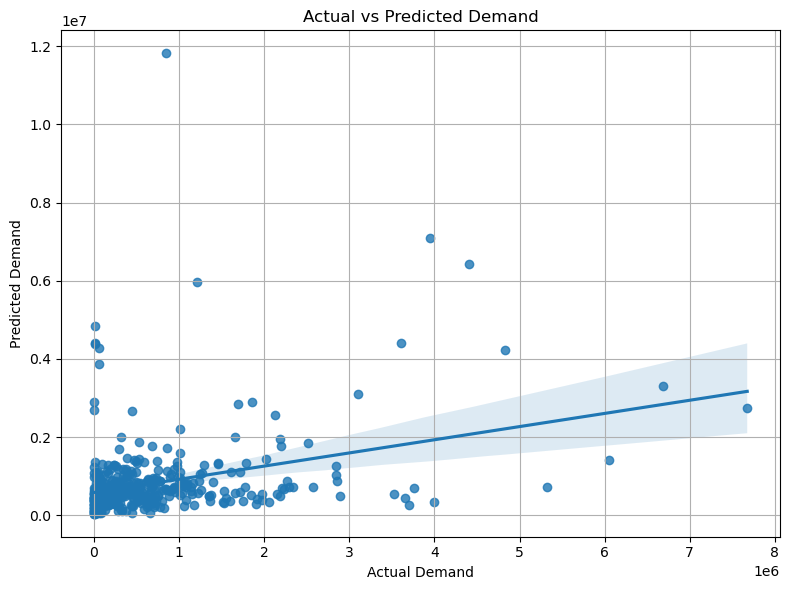

In [4]:
import seaborn as sns

# Create a DataFrame for actual and predicted values
df_results = pd.DataFrame({'Actual': y_test, 'Predicted': predictions})

# Plot scatter plot with regression line
plt.figure(figsize=(8, 6))
sns.regplot(x='Actual', y='Predicted', data=df_results)
plt.title('Actual vs Predicted Demand')
plt.xlabel('Actual Demand')
plt.ylabel('Predicted Demand')
plt.grid(True)
plt.tight_layout()
plt.show()


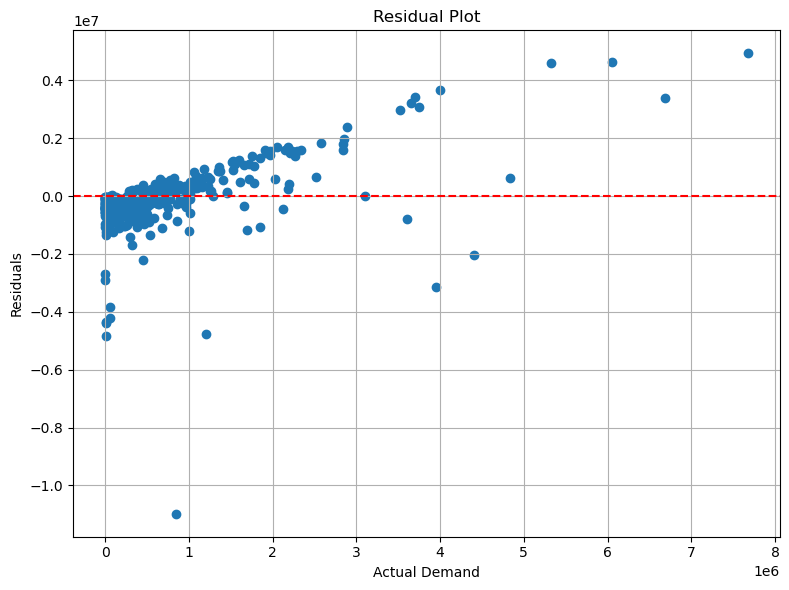

In [5]:
# Calculate residuals
residuals = y_test - predictions

# Plot residuals against actual values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, residuals)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot')
plt.xlabel('Actual Demand')
plt.ylabel('Residuals')
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\balam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


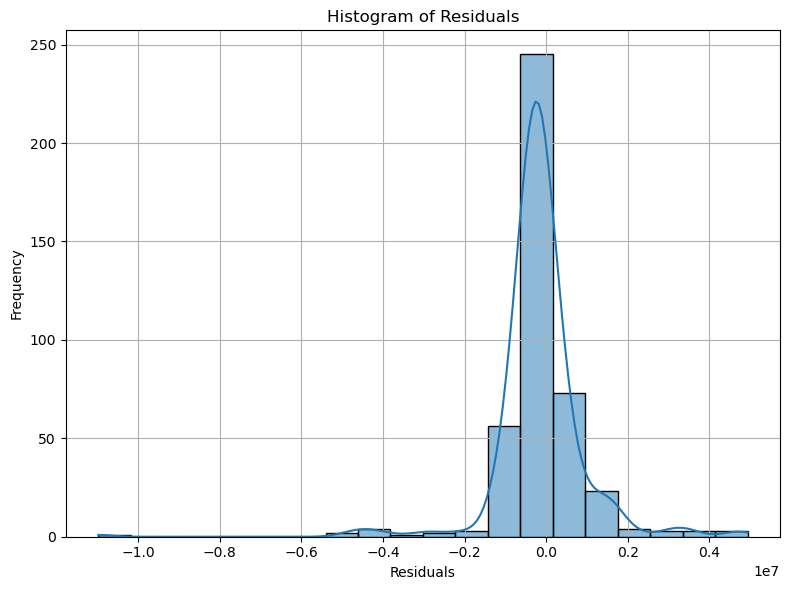

In [6]:
# Plot histogram of residuals
plt.figure(figsize=(8, 6))
sns.histplot(residuals, bins=20, kde=True)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()


## LinearRegression Model

In [7]:
from sklearn.linear_model import LinearRegression

# Model training for demand forecasting using Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train[['Year', 'Month', 'Day', 'Weekday']], y_train)

# Predictions using Linear Regression model
linear_predictions = linear_model.predict(X_test[['Year', 'Month', 'Day', 'Weekday']])

# Evaluate forecast accuracy for Linear Regression model
linear_rmse = mean_squared_error(y_test, linear_predictions, squared=False)
print("Root Mean Squared Error (RMSE) for Demand Forecasting (Linear Regression):", linear_rmse)


Root Mean Squared Error (RMSE) for Demand Forecasting (Linear Regression): 968284.8181732779


### Plots

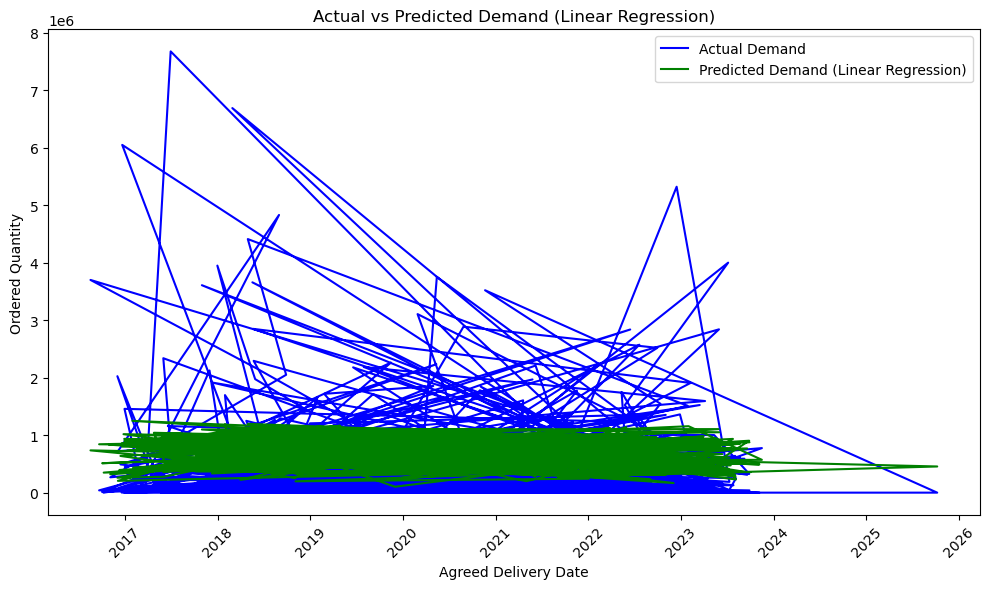

In [8]:
# Plot actual vs predicted demand for Linear Regression
plt.figure(figsize=(10, 6))
plt.plot(X_test['Agreed Delivery Date'], y_test, label='Actual Demand', color='blue')
plt.plot(X_test['Agreed Delivery Date'], linear_predictions, label='Predicted Demand (Linear Regression)', color='green')
plt.xlabel('Agreed Delivery Date')
plt.ylabel('Ordered Quantity')
plt.title('Actual vs Predicted Demand (Linear Regression)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


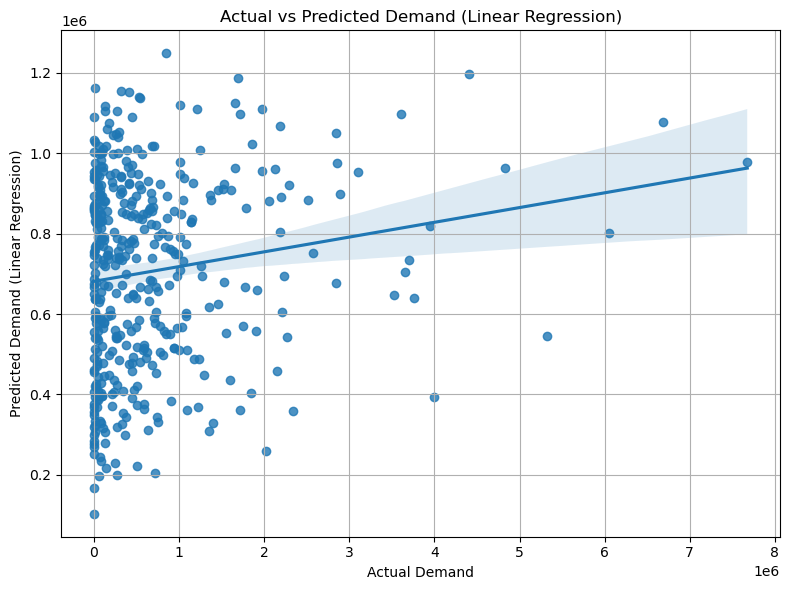

In [9]:
import seaborn as sns

# Scatter plot with regression line for Linear Regression
plt.figure(figsize=(8, 6))
sns.regplot(x=y_test, y=linear_predictions)
plt.title('Actual vs Predicted Demand (Linear Regression)')
plt.xlabel('Actual Demand')
plt.ylabel('Predicted Demand (Linear Regression)')
plt.grid(True)
plt.tight_layout()
plt.show()


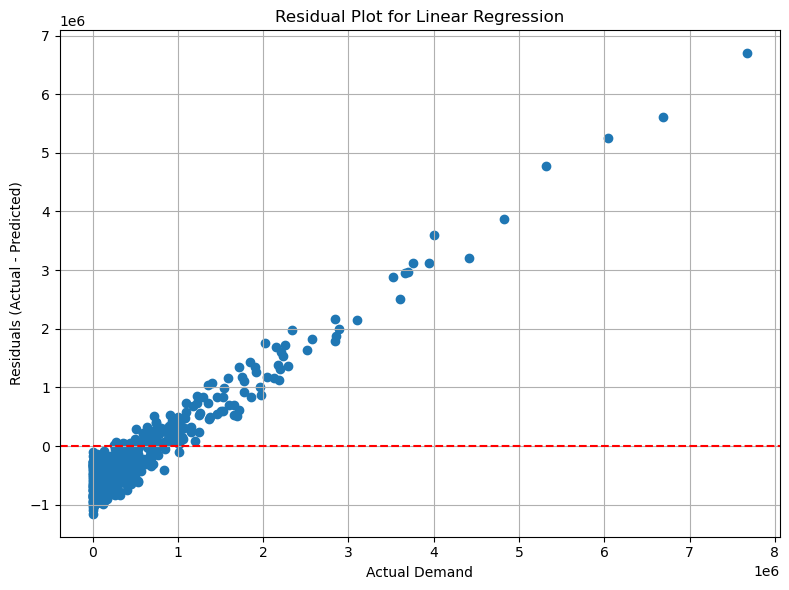

In [10]:
# Calculate residuals for Linear Regression
linear_residuals = y_test - linear_predictions

# Plot residuals against actual values for Linear Regression
plt.figure(figsize=(8, 6))
plt.scatter(y_test, linear_residuals)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot for Linear Regression')
plt.xlabel('Actual Demand')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\balam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


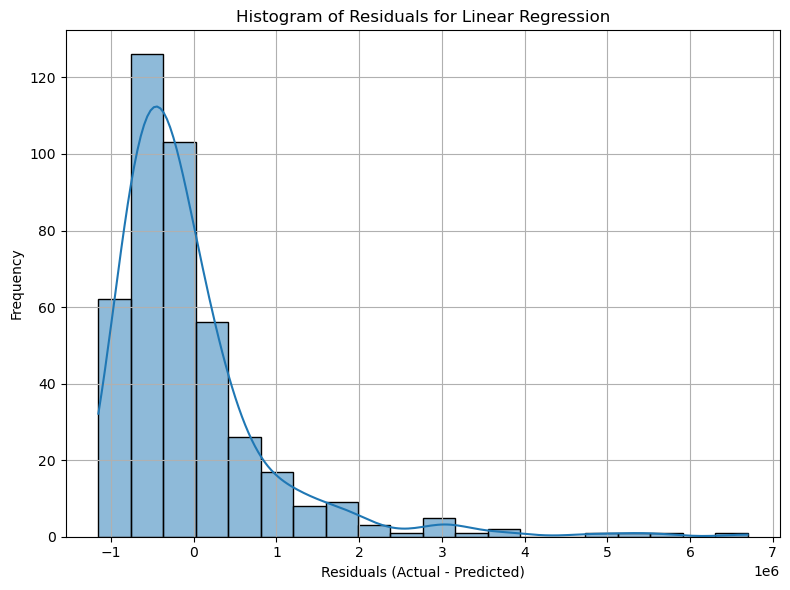

In [11]:
# Plot histogram of residuals for Linear Regression
plt.figure(figsize=(8, 6))
sns.histplot(linear_residuals, bins=20, kde=True)
plt.title('Histogram of Residuals for Linear Regression')
plt.xlabel('Residuals (Actual - Predicted)')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()


## Predictive Model for Delivery Delay Prediction in Supply Chain Operations

### This model is a binary classification model designed to predict whether a delivery will be delayed or not based on various features related to supply chain operations. It utilizes a RandomForestClassifier algorithm to make these predictions. In the context of a smart supply chain: Prediction of Delays: By analyzing historical data and various attributes of deliveries such as order details, transportation mode, and vendor information, the model predicts whether a delivery is likely to be delayed or not. This prediction can help supply chain managers proactively identify potential delays and take preventive actions. Optimizing Operations: By accurately identifying deliveries at risk of delays, supply chain processes can be optimized. For instance, resources can be allocated more efficiently, alternative routes or suppliers can be identified, and contingency plans can be put in place to mitigate delays. Enhancing Customer Satisfaction: Timely deliveries are crucial for maintaining customer satisfaction. By predicting delays in advance, the company can communicate proactively with customers, manage expectations, and potentially avoid negative experiences caused by late deliveries. Data-Driven Decision Making: The model leverages historical data and machine learning techniques to make predictions. This enables supply chain managers to make data-driven decisions, identify patterns, and continuously improve operational efficiency. Overall, the model contributes to building a smarter and more efficient supply chain by leveraging predictive analytics to anticipate and manage delivery delays effectively.

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Read the dataset
data = pd.read_csv("USAID_GHSC-PSM_Health_Commodity_Delivery_Dataset_20240315.csv", low_memory=False)

# Define features and target variable
X = data.drop(columns=['Average Days Late'])
y = (data['Average Days Late'] > 0).astype(int)  # Binary classification: 1 if delayed, 0 if not delayed

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean'))
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))])

# Train the model
clf.fit(X_train, y_train)

# Make predictions
predictions = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, predictions))


Accuracy: 0.9493572263342424

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      5263
           1       0.97      0.87      0.92      2438

    accuracy                           0.95      7701
   macro avg       0.95      0.93      0.94      7701
weighted avg       0.95      0.95      0.95      7701



### Plots

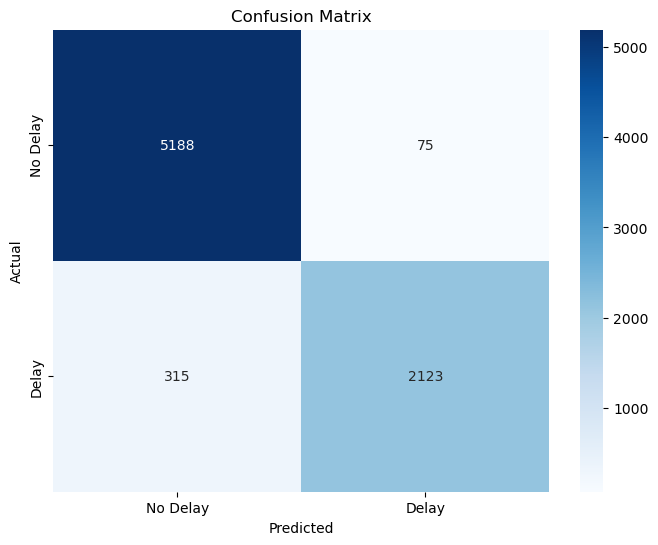

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(y_test, predictions)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Delay', 'Delay'], yticklabels=['No Delay', 'Delay'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


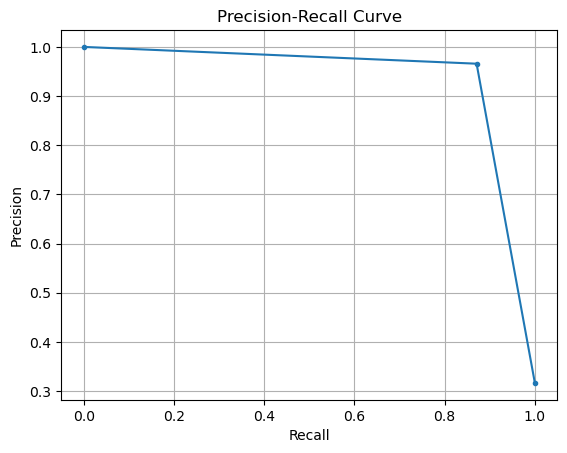

In [15]:
from sklearn.metrics import precision_recall_curve

# Compute precision and recall values
precision, recall, thresholds = precision_recall_curve(y_test, predictions)

# Plot precision-recall curve
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.grid(True)
plt.show()


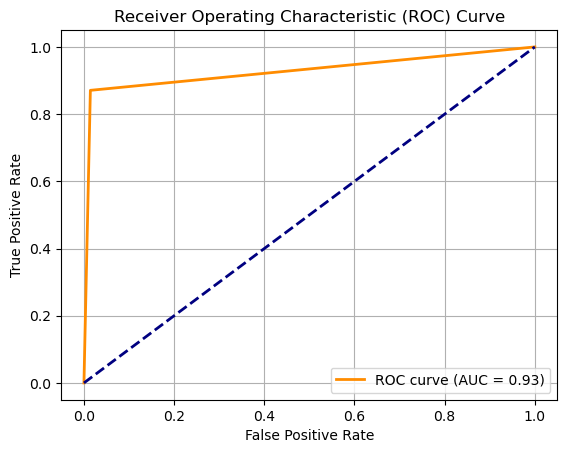

In [16]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, predictions)

# Compute Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
# Get feature importances
importances = clf.named_steps['classifier'].feature_importances_
features = numeric_features.tolist() + clf.named_steps['preprocessor'].named_transformers_['cat'].named_steps['onehot'].get_feature_names_out(categorical_features).tolist()

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()


C:\Users\balam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
